# Network Analysis Overview

1. **Visual representation of the general network**

2. **Understanding the distribution of connected components**

3. **Understanding the number of companies that a trader/insider are linked to in the network**

4. **Eigenvector centrality measure and subgraphs/egonets for two nodes with the highest score**

5. **Network-based anomaly detection**
   - 5a. Applying the OddBall algorithm — *Akoglu, McGlohon & Faloutsos (2010)*
   - 5b. Proving the underlying conditions that must hold for this algorithm to yield valid results for weighted networks

----

*Nodes: 2076 ||  Edges: 3828*

---

In [18]:
all_trades = pd.read_parquet("/Users/gianjaeger/Desktop/Networks Summative Project/All trades (use for replication)/all_trades.parquet")

In [3]:
# Import edges (generated by C++ script)
all_edges = pd.read_csv('/Users/gianjaeger/Desktop/Networks Summative Project/network_cpp/edges.csv')

In [2]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import Counter
import seaborn as sns
import numpy as np
from numpy.linalg import eigvals
from scipy.stats import linregress

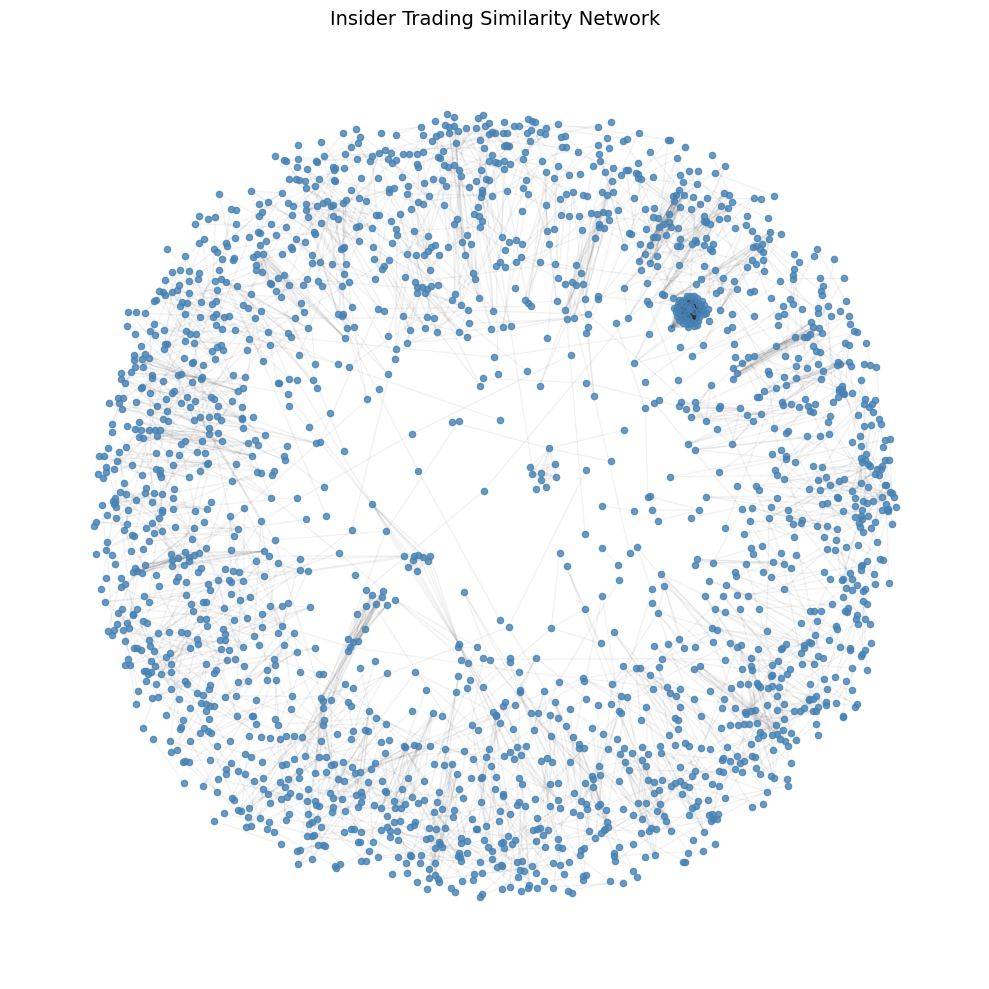

In [7]:
# Overall depiction of the network

# Ensure the edges are clean
all_edges = all_edges.dropna(subset=["source", "target"])
all_edges["source"] = all_edges["source"].astype(str)
all_edges["target"] = all_edges["target"].astype(str)

# Build the graph
G = nx.Graph()
G.add_edges_from(zip(all_edges["source"], all_edges["target"]))

# Compute layout
pos = nx.spring_layout(G, seed=42, k=0.15)  # k controls spacing between nodes

# Draw the network
plt.figure(figsize=(10, 10))
nx.draw_networkx_nodes(G, pos, node_size=20, node_color='steelblue', alpha=0.8)
nx.draw_networkx_edges(G, pos, alpha=0.05)
plt.axis("off")
plt.title("Insider Trading Similarity Network", fontsize=14)
plt.tight_layout()
plt.show()

**Part 1: Connected Components**

RQ: Do they follow a powerlaw distribution? If so what does this tell us?

In [ ]:
# Step 1: Build the graph from your all_edges DataFrame
G = nx.from_pandas_edgelist(all_edges, source='source', target='target')

# Step 2: Count connected components (for an undirected graph)
num_components = nx.number_connected_components(G)

print(f"Number of connected components in the network: {num_components}")

Number of connected components in the network: 616


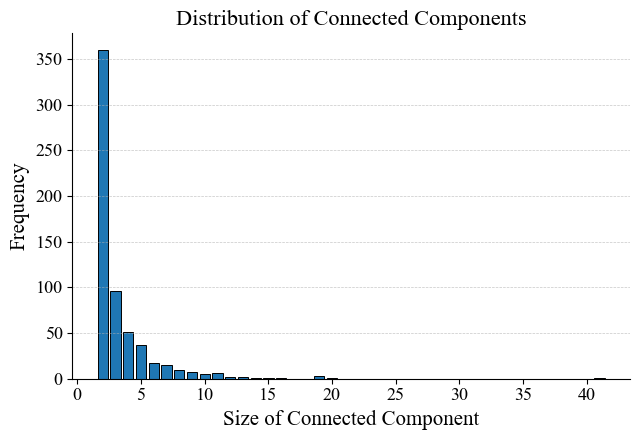

In [ ]:
# Forcefully disable LaTeX rendering and use Times New Roman
plt.rcParams.update({
    "text.usetex": False,  # 🔒 disables any LaTeX
    "font.family": "Times New Roman",
    "axes.edgecolor": "black",
    "axes.linewidth": 0.8,
    "xtick.color": "black",
    "ytick.color": "black",
    "axes.labelcolor": "black",
    "text.color": "black",
    "xtick.labelsize": 13,  # ⬅ increase tick label font size
    "ytick.labelsize": 13
})

# Build the graph from the edge list
G = nx.from_pandas_edgelist(all_edges, source='source', target='target')

# Compute connected component sizes
component_sizes = [len(c) for c in nx.connected_components(G)]
size_distribution = Counter(component_sizes)

# Sort and prepare plot data
sizes = sorted(size_distribution)
frequencies = [size_distribution[s] for s in sizes]

# Create bar plot
fig, ax = plt.subplots(figsize=(6.5, 4.5))
ax.bar(sizes, frequencies, edgecolor='black', linewidth=0.7)

# Set larger axis labels and title
ax.set_xlabel("Size of Connected Component", fontsize=15)
ax.set_ylabel("Frequency", fontsize=15)
ax.set_title("Distribution of Connected Components", fontsize=16)

# Style the grid and axes
ax.yaxis.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
ax.xaxis.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Layout and show
plt.tight_layout()
plt.show()

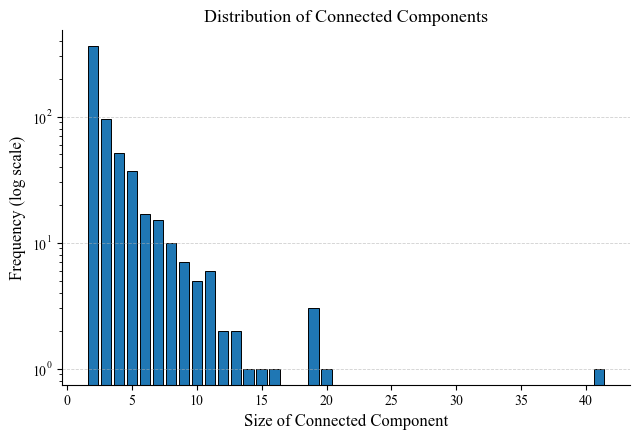

In [20]:
# Times New Roman, no LaTeX
plt.rcParams.update({
    "text.usetex": False,
    "font.family": "Times New Roman",
    "axes.edgecolor": "black",
    "axes.linewidth": 0.8,
    "xtick.color": "black",
    "ytick.color": "black",
    "axes.labelcolor": "black",
    "text.color": "black"
})

# Build graph from all_edges
G = nx.from_pandas_edgelist(all_edges, source='source', target='target')

# Connected component sizes
component_sizes = [len(c) for c in nx.connected_components(G)]
size_distribution = Counter(component_sizes)
sizes = sorted(size_distribution)
frequencies = [size_distribution[s] for s in sizes]

# Plot
fig, ax = plt.subplots(figsize=(6.5, 4.5))
ax.bar(sizes, frequencies, edgecolor='black', linewidth=0.7)

# Labels and styling
ax.set_xlabel("Size of Connected Component", fontsize=12)
ax.set_ylabel("Frequency (log scale)", fontsize=12)
ax.set_title("Distribution of Connected Components", fontsize=13)

# Log scale and cleaner gridlines
ax.set_yscale('log')
ax.yaxis.grid(True, which='major', linestyle='--', linewidth=0.6, alpha=0.6)
ax.yaxis.grid(True, which='minor', linestyle='', linewidth=0)  # disable minor gridlines
ax.xaxis.grid(False)

# Clean borders
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

**Part 2: How many companies are insiders connected to?**

In [ ]:
# 1. Build graph from edges
G = nx.from_pandas_edgelist(all_edges, source='source', target='target')

# 2. Map each node to its component ID
node_to_component = {
    node: i for i, comp in enumerate(nx.connected_components(G)) for node in comp
}

# 3. Create a new DataFrame from edges with component info per source and target
edges_with_components = all_edges.copy()
edges_with_components['source_component'] = edges_with_components['source'].map(node_to_component)
edges_with_components['target_component'] = edges_with_components['target'].map(node_to_component)

# 4. Melt the DataFrame to long format: one row per (node, component, company)
source_df = edges_with_components[['source', 'company', 'source_component']].rename(
    columns={'source': 'node', 'source_component': 'component'})
target_df = edges_with_components[['target', 'company', 'target_component']].rename(
    columns={'target': 'node', 'target_component': 'component'})

long_df = pd.concat([source_df, target_df], ignore_index=True).drop_duplicates()

# 5. For each component, get number of unique companies
component_company_counts = (
    long_df.groupby('component')['company']
    .nunique()
    .value_counts()
    .sort_index()
)

# 6. Convert to percentages
total_components = component_company_counts.sum()
percentage_distribution = (component_company_counts / total_components * 100).round(1)

# 7. Display the results
for num_companies, pct in percentage_distribution.items():
    label = "company" if num_companies == 1 else "companies"
    print(f"{num_companies} {label}: {pct} %")

1 company: 93.2 %
2 companies: 4.2 %
3 companies: 1.1 %
4 companies: 0.3 %
5 companies: 0.6 %
6 companies: 0.3 %
7 companies: 0.2 %


In [23]:
# Step 1: Identify the component ID(s) with 7 companies
companies_per_component = long_df.groupby('component')['company'].nunique()
target_components = companies_per_component[companies_per_component == 7].index.tolist()

print("Component(s) with 7 companies:", target_components)

Component(s) with 7 companies: [69]


In [24]:
# Step 2: Get all insiders (nodes) in this component
insiders_in_target = long_df[long_df['component'].isin(target_components)]['node'].unique()
print("Insiders in component with 7 companies:")
print(insiders_in_target)

Insiders in component with 7 companies:
['dakos andrew' 'goldstein phillip' 'samuels steven']


**Part 3: Centrality meassures**

In [ ]:
# Step 1: Build a graph from the dataframe
def build_weighted_graph(df):
    G = nx.Graph()  # undirected graph

    for _, row in df.iterrows():
        source = row['source']
        target = row['target']
        weight = row['similarity']
        G.add_edge(source, target, weight=weight)
    
    return G

# Step 2: Calculate eigenvector centrality
def compute_eigenvector_centrality(G):
    centrality = nx.eigenvector_centrality(G, weight='weight', max_iter=1000)
    return centrality

# Step 3: Apply it to your data
G = build_weighted_graph(all_edges)
eigen_centrality = compute_eigenvector_centrality(G)

# Step 4: Convert the results to a DataFrame for easy use
eigen_centrality_df = pd.DataFrame(list(eigen_centrality.items()), columns=['insider', 'eigenvector_centrality'])

# Optional: sort it to see the most influential insiders
eigen_centrality_df = eigen_centrality_df.sort_values(by='eigenvector_centrality', ascending=False)

/var/folders/n5/_f2xjmkj39gb7s0th_6lyk9w0000gn/T/ipykernel_16226/1081403045.py:51: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Times New Roman.
  plt.tight_layout()
/var/folders/n5/_f2xjmkj39gb7s0th_6lyk9w0000gn/T/ipykernel_16226/1081403045.py:51: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Times New Roman.
  plt.tight_layout()
/Users/gianjaeger/Library/Python/3.12/lib/python/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Times New Roman.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/gianjaeger/Library/Python/3.12/lib/python/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Times New Roman.
  fig.canvas.print_figure(bytes_io, **kw)


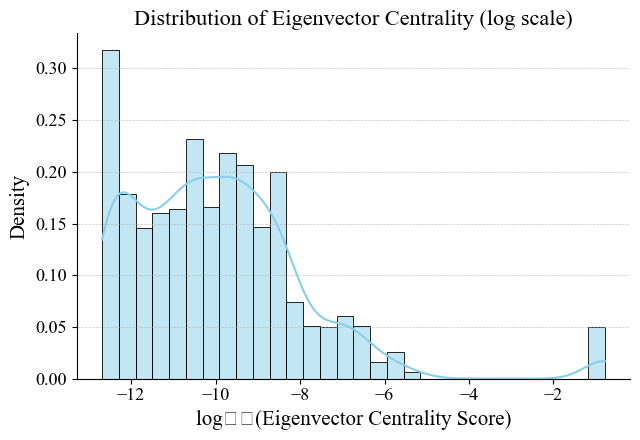

In [ ]:
# Apply consistent font and styling
plt.rcParams.update({
    "text.usetex": False,
    "font.family": "Times New Roman",
    "axes.edgecolor": "black",
    "axes.linewidth": 0.8,
    "xtick.color": "black",
    "ytick.color": "black",
    "axes.labelcolor": "black",
    "text.color": "black",
    "xtick.labelsize": 13,
    "ytick.labelsize": 13
})

# Filter out zero or near-zero values (log(0) is undefined)
filtered = eigen_centrality_df[eigen_centrality_df['eigenvector_centrality'] > 0]

# Set up the figure
fig, ax = plt.subplots(figsize=(6.5, 4.5))

# Plot histogram and KDE using log-transformed x-values
log_values = np.log10(filtered['eigenvector_centrality'])

sns.histplot(
    log_values,
    bins=30,
    kde=True,
    stat="density",
    color="skyblue",
    edgecolor="black",
    linewidth=0.6,
    ax=ax
)

# Set axes and titles
ax.set_xlabel("log₁₀(Eigenvector Centrality Score)", fontsize=15)
ax.set_ylabel("Density", fontsize=15)
ax.set_title("Distribution of Eigenvector Centrality (log scale)", fontsize=16)

# Clean styling
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.yaxis.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
ax.xaxis.grid(False)

# Final display
plt.tight_layout()
plt.show()

/var/folders/n5/_f2xjmkj39gb7s0th_6lyk9w0000gn/T/ipykernel_84822/359253901.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  edge_cmap = cm.get_cmap('viridis')


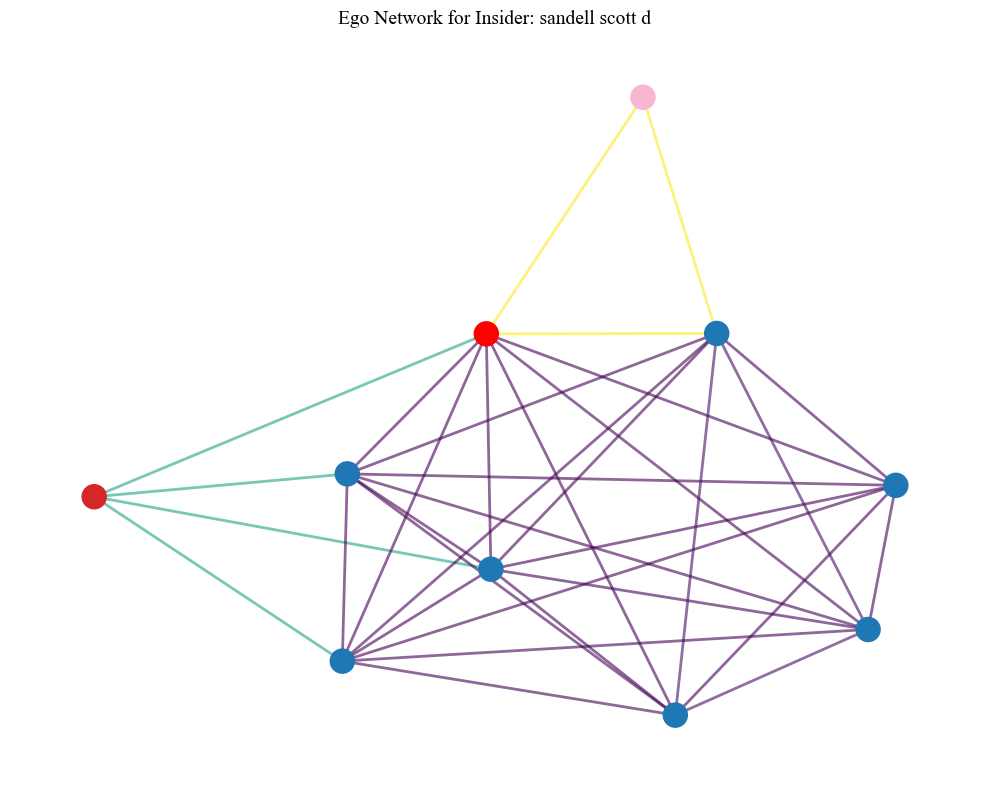

In [ ]:
from utils.centrality import plot_named_ego_network

plot_named_ego_network("sandell scott d", all_edges, radius=2)

/var/folders/n5/_f2xjmkj39gb7s0th_6lyk9w0000gn/T/ipykernel_84822/359253901.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  edge_cmap = cm.get_cmap('viridis')


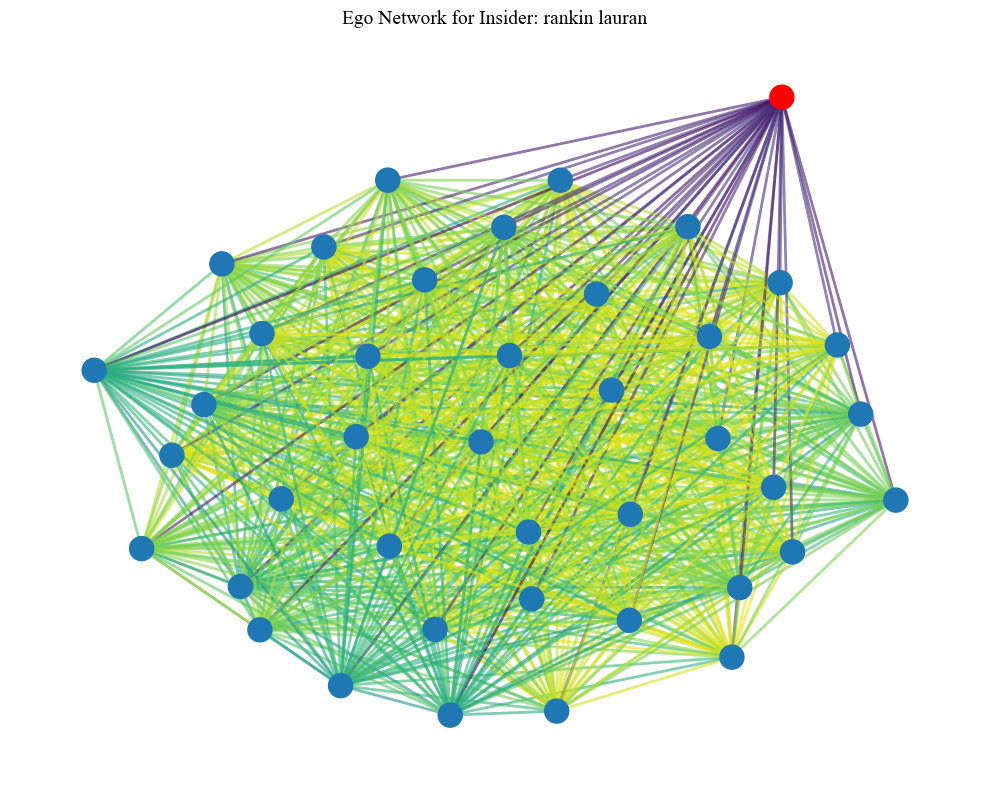

In [76]:
plot_named_ego_network("rankin lauran", all_edges, radius=2)

**Part 3.2: Anomaly Detection - OddBall algorithm to anomaly detection in weighted graphs proposed by Akoglu, McGlohon &Faloutsos (2010) applied**

In [ ]:
from sklearn.neighbors import LocalOutlierFactor
from scipy.stats import linregress

# Step 1: Create weighted graph
G = nx.from_pandas_edgelist(all_edges, source='source', target='target', edge_attr='similarity')

# Step 2: Compute E_i and W_i for each node
data = []
for node in G.nodes():
    ego = nx.ego_graph(G, node, radius=1)
    Ei = ego.number_of_edges()
    Wi = sum(d['similarity'] for u, v, d in ego.edges(data=True))
    if Ei > 0 and Wi > 0:
        data.append({'node': node, 'Ei': Ei, 'Wi': Wi})

df = pd.DataFrame(data)

# Step 3: Fit power law W_i ~ E_i^beta
log_E = np.log(df['Ei'])
log_W = np.log(df['Wi'])
beta, intercept, _, _, _ = linregress(log_E, log_W)
C = np.exp(intercept)

# Step 4: Compute out-line(i)
expected_Wi = C * df['Ei'] ** beta
numerator = np.maximum(df['Wi'], expected_Wi)
denominator = np.minimum(df['Wi'], expected_Wi)
df['out_line'] = (numerator / denominator) * np.log(np.abs(df['Wi'] - expected_Wi) + 1)

# Step 5: Compute out-lof(i)
X = df[['Ei', 'Wi']]
lof = LocalOutlierFactor(n_neighbors=20)
df['out_lof'] = -lof.fit_predict(X)  # gives +1 for inliers, -1 for outliers
df['out_lof_score'] = lof.negative_outlier_factor_

# Step 6: Normalize scores and compute out-score(i)
df['out_line_norm'] = (df['out_line'] - df['out_line'].min()) / (df['out_line'].max() - df['out_line'].min())
df['out_lof_norm'] = (df['out_lof_score'] - df['out_lof_score'].min()) / (df['out_lof_score'].max() - df['out_lof_score'].min())
df['out_score'] = df['out_line_norm'] + df['out_lof_norm']

# Step 7: Sort and show top 20 anomalous nodes
df_sorted = df.sort_values('out_score', ascending=False)[['node', 'Ei', 'Wi', 'out_line', 'out_lof_score', 'out_score']]

print("Top 20 Anomalous Nodes Based on Egonet Deviation + LOF:")
print(df_sorted.head(20).to_string(index=False))

Top 20 Anomalous Nodes Based on Egonet Deviation + LOF:
                     node  Ei          Wi  out_line  out_lof_score  out_score
         jones charles j.  10   231.03120 28.851361      -1.086782   1.978342
              budman gleb  10   231.03120 28.851361      -1.086782   1.978342
         nufire timothy m  10   231.03120 28.851361      -1.086782   1.978342
           wilson brian k  10   231.03120 28.851361      -1.086782   1.978342
             ng kwok hang  10   231.03120 28.851361      -1.086782   1.978342
       rankin elisabeth m 820 14496.34588 26.322140      -1.000000   1.901419
            rankin mary m 820 14496.34588 26.322140      -1.000000   1.901419
         butler griffin b 820 14496.34588 26.322140      -1.000000   1.901419
  rankin margaret pollard 820 14496.34588 26.322140      -1.000000   1.901419
           rankin lynne t 820 14496.34588 26.322140      -1.000000   1.901419
            rankin lauran 820 14496.34588 26.322140      -1.000000   1.901419
        

In [5]:
# Append stock tickers to the respective insiders with reference to the source column

# Group company names for each person (from 'source' in all_edges)
company_groups = all_edges.groupby('source')['company'].unique().to_dict()

# Create up to 7 columns of company names per node
def get_company_columns(node):
    companies = company_groups.get(node, [])
    companies = list(companies)[:7]  # max 7
    companies += [np.nan] * (7 - len(companies))  # pad with NaNs if fewer
    return pd.Series(companies, index=[f'company_{i+1}' for i in range(7)])

# Apply to df_sorted and merge
company_expanded = df_sorted['node'].apply(get_company_columns)
df_sorted1 = pd.concat([df_sorted, company_expanded], axis=1)

In [6]:
# Append stock tickers to the respective insiders with reference to the target column (not all people are mentioned as a source)

# Group company names for each person (from 'source' in all_edges)
company_groups = all_edges.groupby('target')['company'].unique().to_dict()

# Create up to 7 columns of company names per node
def get_company_columns(node):
    companies = company_groups.get(node, [])
    companies = list(companies)[:7]  # max 7
    companies += [np.nan] * (7 - len(companies))  # pad with NaNs if fewer
    return pd.Series(companies, index=[f'company_{i+1}' for i in range(7)])

# Apply to df_sorted and merge
company_expanded = df_sorted['node'].apply(get_company_columns)
df_sorted2 = pd.concat([df_sorted, company_expanded], axis=1)

In [7]:
# Define company columns
company_cols = [f'company_{i}' for i in range(1, 8)]

# Ensure the same index order (optional but safe)
df_sorted2 = df_sorted2.reindex(df_sorted1.index)

# Fill in missing values in df_sorted1 using values from df_sorted2
for col in company_cols:
    df_sorted1[col] = df_sorted1[col].combine_first(df_sorted2[col])

# Get back original name (this was done because the code that follows was develoepd before the three cells above were added)
df_sorted = df_sorted1

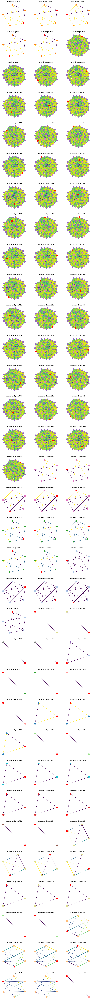

In [9]:
from utils.anomaly_egonets import plot_top_anomalous_egonets

plot_top_anomalous_egonets(df_sorted, G, top_k=99)

**Part 3: Proving that the conditions for the OddBall algorithm proposed by Akoglu, McGlohon and Faloutsos (2010) were met**

EDPL exponent (α): 1.69, R²: 0.99
EWPL exponent (β): 1.09, R²: 0.88


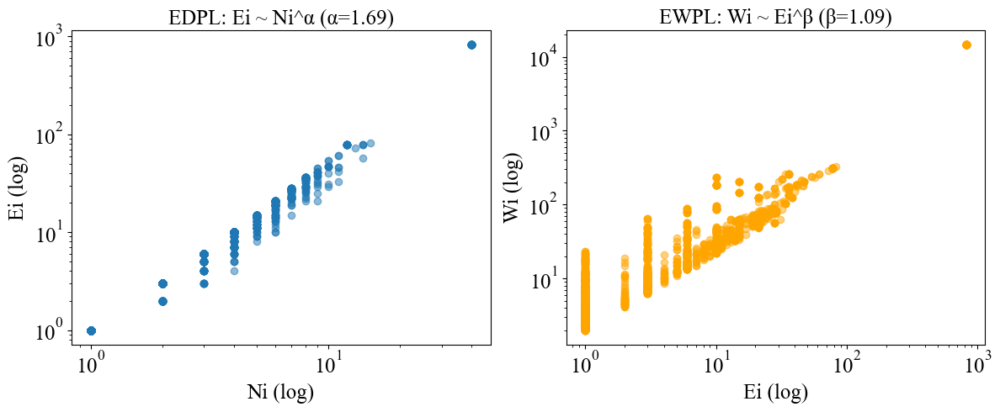

In [10]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import networkx as nx
import pandas as pd
import numpy as np
from scipy.stats import linregress

# Set global font to Times New Roman and label size to 16
mpl.rcParams['font.family'] = 'Times New Roman'
mpl.rcParams['axes.labelsize'] = 18
mpl.rcParams['xtick.labelsize'] = 18
mpl.rcParams['ytick.labelsize'] = 18
mpl.rcParams['legend.fontsize'] = 18
mpl.rcParams['axes.titlesize'] = 18

# 1. Build graph
G = nx.from_pandas_edgelist(all_edges, source='source', target='target', edge_attr='similarity')

# 2. Containers for egonet features
egonet_data = []

# 3. Compute N_i, E_i, W_i for each node
for node in G.nodes():
    ego = nx.ego_graph(G, node, radius=1)
    Ni = len(ego.nodes()) - 1  # excluding center node
    Ei = len(ego.edges())
    Wi = sum([d['similarity'] for u, v, d in ego.edges(data=True)])
    
    if Ni > 0 and Ei > 0:
        egonet_data.append({'node': node, 'Ni': Ni, 'Ei': Ei, 'Wi': Wi})

df_egonet = pd.DataFrame(egonet_data)

# 4. Fit EDPL: Ei ~ Ni^alpha (log-log regression)
x1, y1 = np.log(df_egonet['Ni']), np.log(df_egonet['Ei'])
alpha_slope, _, r_value1, _, _ = linregress(x1, y1)

# 5. Fit EWPL: Wi ~ Ei^beta
x2, y2 = np.log(df_egonet['Ei']), np.log(df_egonet['Wi'])
beta_slope, _, r_value2, _, _ = linregress(x2, y2)

print(f"EDPL exponent (α): {alpha_slope:.2f}, R²: {r_value1**2:.2f}")
print(f"EWPL exponent (β): {beta_slope:.2f}, R²: {r_value2**2:.2f}")

# 6. Plot EDPL
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.scatter(df_egonet['Ni'], df_egonet['Ei'], alpha=0.5)
plt.xscale('log')
plt.yscale('log')
plt.title(f"EDPL: Ei ~ Ni^α (α={alpha_slope:.2f})")
plt.xlabel("Ni (log)")
plt.ylabel("Ei (log)")

# 7. Plot EWPL
plt.subplot(1, 2, 2)
plt.scatter(df_egonet['Ei'], df_egonet['Wi'], alpha=0.5, color='orange')
plt.xscale('log')
plt.yscale('log')
plt.title(f"EWPL: Wi ~ Ei^β (β={beta_slope:.2f})")
plt.xlabel("Ei (log)")
plt.ylabel("Wi (log)")

plt.tight_layout()
plt.show()

ELWPL exponent (γ): 0.66, R²: 0.96


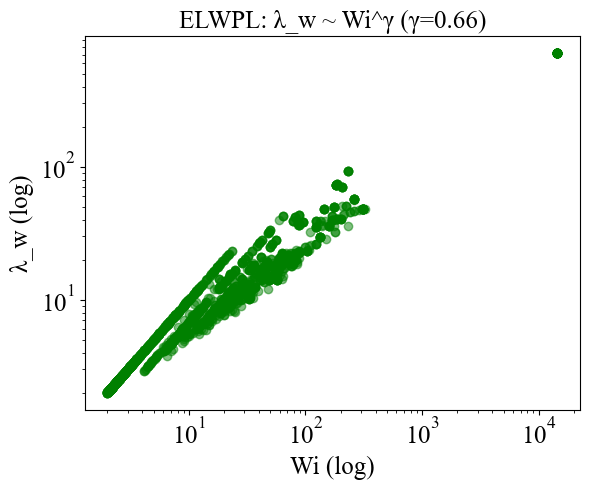

In [11]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from numpy.linalg import eigvals
import networkx as nx

# Set global font to Times New Roman and label size to 16
mpl.rcParams['font.family'] = 'Times New Roman'
mpl.rcParams['axes.labelsize'] = 18
mpl.rcParams['xtick.labelsize'] = 18
mpl.rcParams['ytick.labelsize'] = 18
mpl.rcParams['legend.fontsize'] = 18
mpl.rcParams['axes.titlesize'] = 18

# Add λ_w computation for each node
lambdas = []
for node in df_egonet['node']:
    ego = nx.ego_graph(G, node, radius=1)
    
    if len(ego) > 1:
        # Create weighted adjacency matrix
        A = nx.to_numpy_array(ego, weight='similarity')
        # Compute the largest eigenvalue
        lambda_w = max(eigvals(A).real)
    else:
        lambda_w = np.nan
    
    lambdas.append(lambda_w)

df_egonet['lambda_w'] = lambdas
df_egonet.dropna(subset=['lambda_w'], inplace=True)

# Fit ELWPL: λ_w ~ W^γ
x3, y3 = np.log(df_egonet['Wi']), np.log(df_egonet['lambda_w'])
gamma_slope, _, r_value3, _, _ = linregress(x3, y3)

print(f"ELWPL exponent (γ): {gamma_slope:.2f}, R²: {r_value3**2:.2f}")

# Plot ELWPL
plt.figure(figsize=(6, 5))
plt.scatter(df_egonet['Wi'], df_egonet['lambda_w'], alpha=0.5, color='green')
plt.xscale('log')
plt.yscale('log')
plt.title(f"ELWPL: λ_w ~ Wi^γ (γ={gamma_slope:.2f})")
plt.xlabel("Wi (log)")
plt.ylabel("λ_w (log)")
plt.tight_layout()
plt.show()


Average ERPL exponent (θ): -0.22


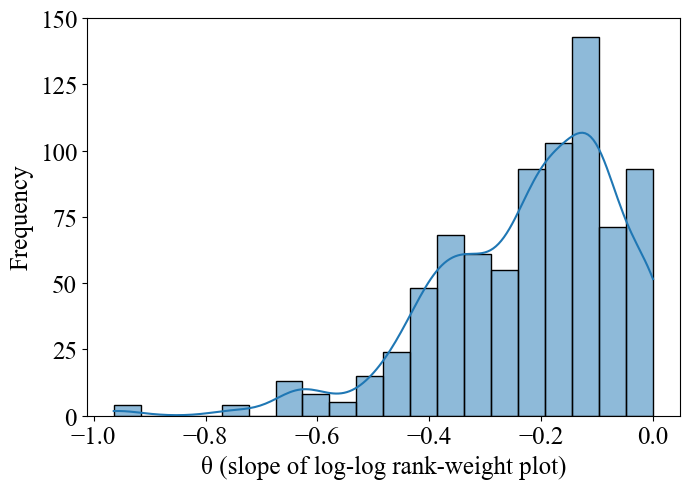

In [14]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import numpy as np
from scipy.stats import linregress
import networkx as nx

# Set global font to Times New Roman and label size to 16
mpl.rcParams['font.family'] = 'Times New Roman'
mpl.rcParams['axes.labelsize'] = 18
mpl.rcParams['xtick.labelsize'] = 18
mpl.rcParams['ytick.labelsize'] = 18
mpl.rcParams['legend.fontsize'] = 18
mpl.rcParams['axes.titlesize'] = 18

all_thetas = []

for node in df_egonet['node']:
    ego = nx.ego_graph(G, node, radius=1)
    edge_weights = [d['similarity'] for _, _, d in ego.edges(data=True)]
    
    if len(edge_weights) > 5:  # need a few points for regression
        edge_weights_sorted = sorted(edge_weights, reverse=True)
        ranks = np.arange(1, len(edge_weights_sorted) + 1)
        log_ranks = np.log(ranks)
        log_weights = np.log(edge_weights_sorted)
        
        theta, _, r_value, _, _ = linregress(log_ranks, log_weights)
        all_thetas.append(theta)

# Summarize θ
theta_mean = np.mean(all_thetas)
print(f"Average ERPL exponent (θ): {theta_mean:.2f}")

# Plot distribution of θ
plt.figure(figsize=(7, 5))
sns.histplot(all_thetas, kde=True)
plt.xlabel("θ (slope of log-log rank-weight plot)")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

----